# Network-wide LTS Distribution, Density and Fragmentation

The analyses below evaluate whether the West Midlands network delivers on the
LTN 1/20 "cycling for all" principle by testing connectivity at LTS 1 (children
and older adults) and LTS ≤ 2 (mainstream adults), with LTS ≤ 3 and ≤ 4 included
for comparison (Mekuria, Furth and Nixon, 2012; Department for Transport, 2020a).
Following Vierø et al. (2025) and Schön, Heinen and Manum (2024), the evaluation
proceeds through **area-based distribution**, **stress-based network
density** and **network fragmentation**.

**This Section inculdes:**

- **Network-wide LTS distribution.** Composition of the final classification by
  edge count and length, the urban and rural split, and a recap of how junction
  enhancement reshaped the profile.
- **Stress-based network density.** Absolute (km/km²) and relative (% of local
  network) low-stress density at LSOA level, and population exposure.
- **Network fragmentation.** Connected-component analysis across cumulative LTS
  thresholds, the largest connected component (LCC) and its share, and the spatial
  distribution of connectivity.

Figure numbers in the markdown headers match the intended dissertation figures.

## 1. Environment and Study Area

In [39]:
import warnings
warnings.filterwarnings('ignore')

import os
from pathlib import Path

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)       
pd.set_option('display.width', 1000)            
pd.set_option('display.max_colwidth', None) 

import geopandas as gpd

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from shapely.geometry import Point, LineString, Polygon
from shapely import wkt
from shapely.wkt import loads

import contextily as cx

DATA_DIR = Path('../Data/Raw')
CLEANED_DIR = Path('../Data/Cleaned')
OUTPUT_DIR = Path('../Data/Cleaned')
CRS_BNG = 'EPSG:27700'

pd.set_option('display.max_columns', None)


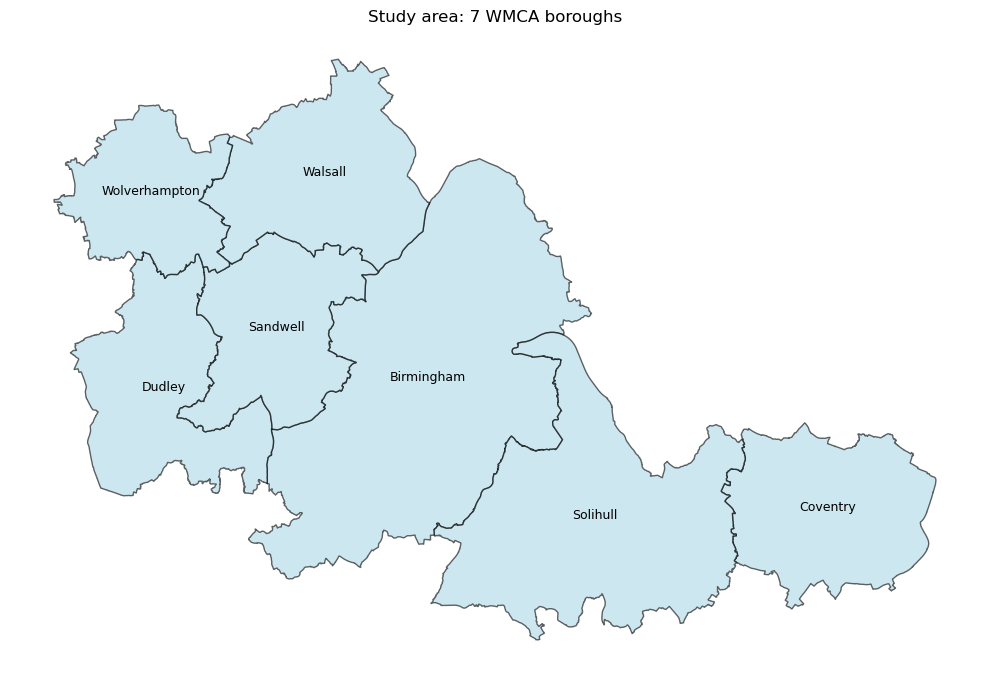


Total study area: 901.7 km²


In [40]:
# Study area boundary
STUDY_AREA_BOROUGHS = [
    'Birmingham',
    'Coventry',
    'Dudley',
    'Sandwell',
    'Solihull',
    'Walsall',
    'Wolverhampton',
]

# Load ONS Local Authority District boundaries
raw_data = gpd.read_file(
    DATA_DIR / "Local_Authority_Districts_DEC_2025_Boundaries_UK_BFC_7781342770234899863/LAD_DEC_2025_UK_BFC.shp"
)

# Filter for WMCA boroughs and reproject to BNG
study_area = raw_data[raw_data['LAD25NM'].isin(STUDY_AREA_BOROUGHS)].copy()
study_area = study_area.to_crs(CRS_BNG)
study_area_union = study_area.unary_union

# Visual check
fig, ax = plt.subplots(figsize=(10, 10))
study_area.plot(ax=ax, edgecolor='black', facecolor='lightblue', alpha=0.6)
study_area.apply(lambda r: ax.annotate(
    text=r['LAD25NM'],
    xy=(r.geometry.centroid.x, r.geometry.centroid.y),
    ha='center', fontsize=9
), axis=1)
ax.set_title(f'Study area: {len(STUDY_AREA_BOROUGHS)} WMCA boroughs')
ax.set_axis_off()
plt.tight_layout()
plt.show()

total_area_km2 = study_area.geometry.area.sum() / 1e6
print(f"\nTotal study area: {total_area_km2:.1f} km²")


## 2. Load the Junction-Enhanced Network

Input - `network_lts_with_junctions.gpkg`, exported by `jucntion level of stress`. It carries both the
link-level `lts` and the junction-enhanced `lts_final`, plus `geometry_length_m`.

In [41]:
# Depends on the export from 04a. Run 04a first.
network = gpd.read_file(CLEANED_DIR / "network_lts_with_junctions.gpkg")

if 'geometry_length_m' not in network.columns:
    network['geometry_length_m'] = network.geometry.length

print(f"Loaded junction-enhanced network: {len(network):,} directed edges")
dist = pd.DataFrame({
    'link-level (lts)': network['lts'].value_counts().sort_index(),
    'junction (lts_final)': network['lts_final'].value_counts().sort_index(),
})
print(dist)


Loaded junction-enhanced network: 480,228 directed edges
     link-level (lts)  junction (lts_final)
1.0            325051                227420
2.0             69539                152180
3.0             42465                 46464
4.0             43173                 54164


## 3. Network-wide LTS Distribution

The final classification after junction stress enhancement. The headline low-stress
share is high by length, but LTS 3 and 4 form the arterial skeleton that encloses
the low-stress residential clusters. The aggregate also masks a pronounced urban to
rural disparity, examined below.

### Figure — LTS classification map

The directed cyclable network coloured by `lts_final`. LTS 3 and 4 (orange and red)
read as a continuous grid enclosing the low-stress residential streets.

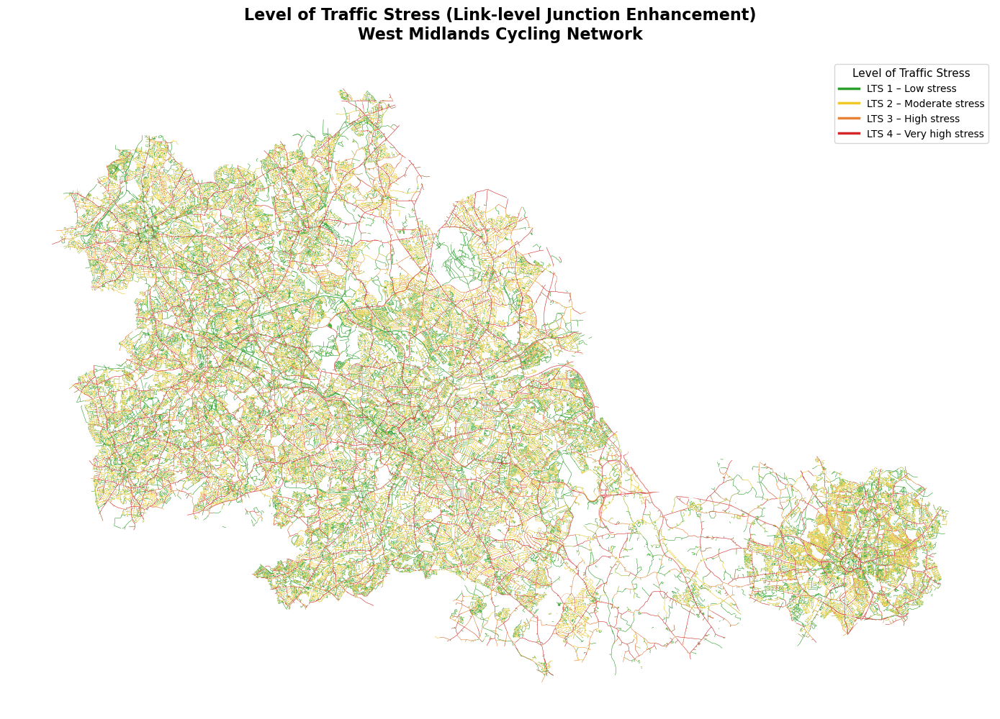

In [42]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

lts_colors = {1: '#2ca02c', 2: '#f0c929', 3: '#e8833a', 4: '#d62728'}
lts_labels = {1: 'LTS 1 \u2013 Low stress', 2: 'LTS 2 \u2013 Moderate stress',
              3: 'LTS 3 \u2013 High stress', 4: 'LTS 4 \u2013 Very high stress'}

fig, ax = plt.subplots(figsize=(14, 16))

for lts in [1, 2, 3, 4]:
    subset = network[network['lts_final'] == lts]
    subset.plot(ax=ax, color=lts_colors[lts], linewidth=0.3, alpha=0.8)

legend_elements = [
    Line2D([0], [0], color=lts_colors[i], linewidth=2.5, label=lts_labels[i])
    for i in [1, 2, 3, 4]
]
ax.legend(handles=legend_elements, loc='upper right', fontsize=10,
          frameon=True, facecolor='white', edgecolor='#cccccc',
          title='Level of Traffic Stress', title_fontsize=11)

ax.set_axis_off()
ax.set_title('Level of Traffic Stress (Link-level Junction Enhancement)\nWest Midlands Cycling Network',
             fontsize=16, fontweight='bold', pad=20)

plt.tight_layout()
plt.show()


### LTS distribution by edge count and network length

In [43]:
# Distribution cited in Section 5.2 (edge counts, edge %, length km, length %)
edge_counts = network['lts_final'].value_counts().sort_index()
edge_pct = edge_counts / edge_counts.sum() * 100
km_by_lts = network.groupby('lts_final')['geometry_length_m'].sum().astype(float) / 1000
km_pct = km_by_lts / km_by_lts.sum() * 100

dist = pd.DataFrame({
    'edges': edge_counts,
    'edge_%': edge_pct.round(1),
    'length_km': km_by_lts.round(1),
    'length_%': km_pct.round(1),
})
print(dist)
print(f"\nTotal directed edges: {len(network):,}")
print(f"Total network length: {km_by_lts.sum():,.1f} km")


            edges  edge_%  length_km  length_%
lts_final                                     
1.0        227420    47.4    10028.0      43.0
2.0        152180    31.7     8126.0      34.9
3.0         46464     9.7     2184.5       9.4
4.0         54164    11.3     2962.4      12.7

Total directed edges: 480,228
Total network length: 23,300.9 km


### Urban and rural composition

Tag each edge as urban or non-urban using the ONS Rural-Urban Classification (OA
level), then split network length, population and area accordingly.

In [44]:
oa_ruc = gpd.read_file(DATA_DIR / 'OA_(2021)_EW_BGC_V2_to_Rural_Urban_Classification.geojson')

# 1. Reproject to BNG
oa_ruc = oa_ruc.to_crs(epsg=27700)

# 2. Check classification values
print(oa_ruc['Urban_rura'].value_counts())
print(oa_ruc['RUC21CD'].value_counts())

Urban_rura
Urban    154723
Rural     34157
Name: count, dtype: int64
RUC21CD
UN1     141584
UF1      13139
RLN1     10787
RSN1     10354
RSF1      7594
RLF1      5422
Name: count, dtype: int64


In [45]:
# 1. Clip to study area and dissolve urban zones
oa_ruc_clipped = gpd.overlay(oa_ruc, study_area[['geometry']], how='intersection')
urban_dissolved = oa_ruc_clipped[oa_ruc_clipped['Urban_rura'] == 'Urban'].dissolve().geometry.iloc[0]

# 2. Tag LTS network edges
network['is_urban'] = network.geometry.representative_point().within(urban_dissolved)
print(network['is_urban'].value_counts())

# 3. Panel A: LTS × urban/non-urban (km)
bike_data = (
    network
    .assign(length_km=network['geometry_length_m'].astype(float) / 1000)
    .groupby(['lts_final', 'is_urban'])['length_km']
    .sum()
    .unstack(fill_value=0)
)
bike_data.columns = ['Non-urban', 'Urban']
bike_pct = bike_data / bike_data.sum().sum() * 100
print(bike_data.round(1))
print(bike_pct.round(1))

# 4. Panel B: Area (km²)
oa_ruc_clipped['area_km2'] = oa_ruc_clipped.geometry.area / 1e6
area_split = oa_ruc_clipped.groupby('Urban_rura')['area_km2'].sum()
area_pct = area_split / area_split.sum() * 100
print("\nArea split:")
print(area_pct.round(1))

is_urban
True     470076
False     10152
Name: count, dtype: int64
           Non-urban   Urban
lts_final                   
1.0            425.1  9602.8
2.0            189.0  7937.0
3.0            145.8  2038.7
4.0            256.5  2705.9
           Non-urban  Urban
lts_final                  
1.0              1.8   41.2
2.0              0.8   34.1
3.0              0.6    8.7
4.0              1.1   11.6

Area split:
Urban_rura
Rural    12.9
Urban    87.1
Name: area_km2, dtype: float64


In [46]:
# =============================================================================
# 1. Join population to OA RUC
# =============================================================================
oa_pop = pd.read_csv(DATA_DIR / 'census2021-ts001/census2021-ts001-oa.csv')
oa_pop = oa_pop.rename(columns={
    'geography code': 'OA21CD',
    'Residence type: Total; measures: Value': 'population'
})
oa_ruc_clipped = oa_ruc_clipped.merge(oa_pop[['OA21CD', 'population']], on='OA21CD', how='left')

# Filter to WMCA boroughs only
wmca_lads = ['Birmingham', 'Coventry', 'Dudley', 'Sandwell', 'Solihull', 'Walsall', 'Wolverhampton']
oa_ruc_clipped['LAD'] = oa_ruc_clipped['LSOA21NM'].str.rsplit(' ', n=1).str[0]
oa_ruc_clipped = oa_ruc_clipped[oa_ruc_clipped['LAD'].isin(wmca_lads)]

# Population split
pop_split = oa_ruc_clipped.groupby('Urban_rura')['population'].sum()
pop_pct = pop_split / pop_split.sum() * 100
print("Population split:")
print(pop_pct.round(1))
print(f"Total population: {oa_ruc_clipped['population'].sum():,.0f}")

# Area split
oa_ruc_clipped['area_km2'] = oa_ruc_clipped.geometry.area / 1e6
area_split = oa_ruc_clipped.groupby('Urban_rura')['area_km2'].sum()
area_pct = area_split / area_split.sum() * 100
print("\nArea split:")
print(area_pct.round(1))

Population split:
Urban_rura
Rural     1.0
Urban    99.0
Name: population, dtype: float64
Total population: 3,092,670

Area split:
Urban_rura
Rural    12.8
Urban    87.2
Name: area_km2, dtype: float64


In [71]:
hierarchy_map = {
    'A Road':                          'A Road',
    'A Road Primary':                  'A Road',
    'B Road':                          'B Road',
    'Minor Road':                      'Minor Road',
    'Local Road':                      'Local Street',
    'Local Access Road':               'Local Street',
    'Secondary Access Road':           'Local Street',
    'Restricted Local Access Road':    'Local Street',
    'Restricted Secondary Access Road':'Local Street',
}

net = network.copy()
net['length_km'] = net['geometry_length_m'].astype(float) / 1000
net['road_group'] = net['routehierarchy'].map(hierarchy_map).fillna('Off-Road Path')

group_km = net.groupby('road_group')['length_km'].sum()
group_km = group_km.reindex(['A Road', 'B Road', 'Minor Road', 'Local Street', 'Off-Road Path'])
group_pct = group_km / group_km.sum() * 100

for name, km, pct in zip(group_km.index, group_km.values, group_pct.values):
    print(f'{name:<15s}  {km:>8,.1f} km   ({pct:5.1f}%)')

print(f'{"Total":<15s}  {group_km.sum():>8,.1f} km   (100.0%)')

A Road            1,296.5 km   (  5.6%)
B Road              787.4 km   (  3.4%)
Minor Road        2,959.1 km   ( 12.7%)
Local Street     14,243.8 km   ( 61.1%)
Off-Road Path     4,014.1 km   ( 17.2%)
Total            23,300.9 km   (100.0%)


### Figure — Network composition by length

Panel A - overall network by length with urban/rural hatching. Panel B - population
and area context. Panel C - LTS composition within urban and within rural.

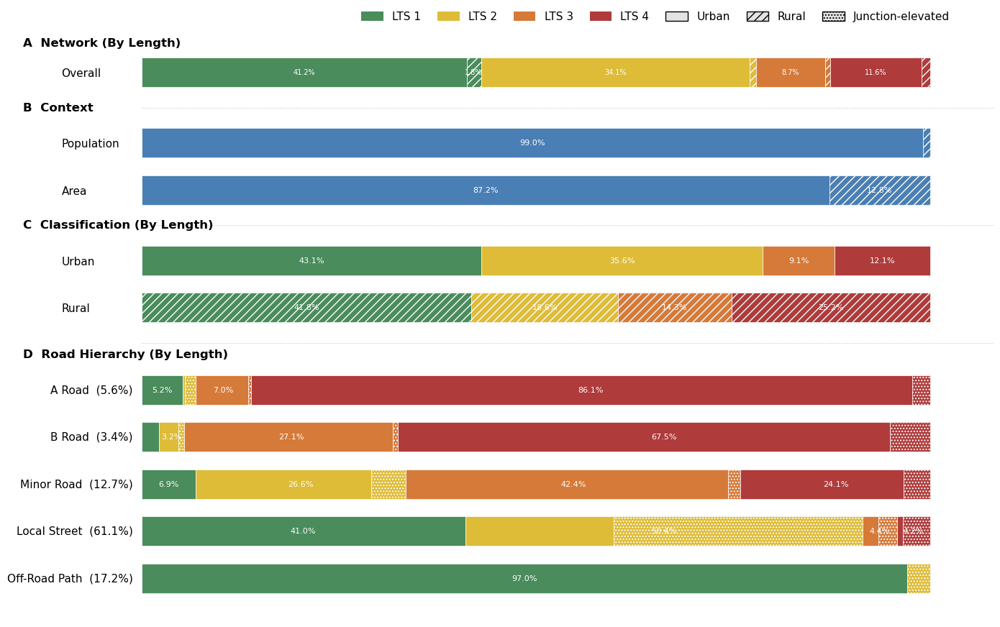

In [73]:
# =============================================================================
# LTS profile: Panels A–D with junction-enhanced hatching in Panel D
# =============================================================================

net = network.copy()
net['length_km'] = net['geometry_length_m'].astype(float) / 1000

# Road hierarchy grouping
hierarchy_map = {
    'A Road':                          'A Road',
    'A Road Primary':                  'A Road',
    'B Road':                          'B Road',
    'Minor Road':                      'Minor Road',
    'Local Road':                      'Local Street',
    'Local Access Road':               'Local Street',
    'Secondary Access Road':           'Local Street',
    'Restricted Local Access Road':    'Local Street',
    'Restricted Secondary Access Road':'Local Street',
}
net['road_group'] = net['routehierarchy'].map(hierarchy_map).fillna('Off-Road Path')

# Flag edges where junction enhancement changed the LTS
net['junc_upgraded'] = net['lts_final'] > net['lts']

# Overall LTS × urban/non-urban
bike_data = (
    net.groupby(['lts_final', 'is_urban'])['length_km']
    .sum().unstack(fill_value=0)
)
bike_data.columns = ['Non-urban', 'Urban']

urban_total = bike_data['Urban'].sum()
rural_total = bike_data['Non-urban'].sum()
urban_pct = bike_data['Urban'] / urban_total * 100
rural_pct = bike_data['Non-urban'] / rural_total * 100

overall_total = bike_data.sum().sum()
overall_pct = bike_data / overall_total * 100

# Road hierarchy × LTS × junction-upgraded
road_lts = (
    net.groupby(['road_group', 'lts_final', 'junc_upgraded'])['length_km']
    .sum().unstack(fill_value=0)
)
road_lts.columns = ['Original', 'Junction-upgraded']
road_totals = net.groupby('road_group')['length_km'].sum()
road_order = ['A Road', 'B Road', 'Minor Road', 'Local Street', 'Off-Road Path']

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

fig, ax = plt.subplots(figsize=(14, 9))

lts_colors = {1: '#4a8c5c', 2: '#debc38', 3: '#d67a39', 4: '#af3b3b'}
context_color = '#4a7fb5'
bar_height = 0.5
rural_hatch = '///'
junction_hatch = '....'

y_positions = {
    'overall': 8,
    'pop': 6.8,
    'area': 6.0,
    'urban': 4.8,
    'rural': 4.0,
    'a_road': 2.6,
    'b_road': 1.8,
    'minor': 1.0,
    'local': 0.2,
    'offroad': -0.6,
}

# --- Panel A: Overall LTS with urban/rural hatch ---
left = 0
for lts in [1, 2, 3, 4]:
    for col, h in [('Urban', ''), ('Non-urban', rural_hatch)]:
        val = overall_pct.loc[lts, col]
        ax.barh(y_positions['overall'], val, left=left, height=bar_height,
                color=lts_colors[lts], hatch=h, edgecolor='white', linewidth=0.5)
        if val >= 1.5:
            ax.text(left + val/2, y_positions['overall'], f'{val:.1f}%',
                    ha='center', va='center', fontsize=7, color='white')
        left += val

# --- Panel B: Population ---
u = pop_pct.get('Urban', 0)
r = pop_pct.get('Rural', 0)
ax.barh(y_positions['pop'], u, height=bar_height,
        color=context_color, edgecolor='white', linewidth=0.5)
ax.barh(y_positions['pop'], r, left=u, height=bar_height,
        color=context_color, hatch=rural_hatch, edgecolor='white', linewidth=0.5)
ax.text(u/2, y_positions['pop'], f'{u:.1f}%', ha='center', va='center',
        fontsize=8, color='white')
if r >= 2:
    ax.text(u + r/2, y_positions['pop'], f'{r:.1f}%', ha='center', va='center',
            fontsize=8, color='white')

# --- Panel B: Area ---
u = area_pct.get('Urban', 0)
r = area_pct.get('Rural', 0)
ax.barh(y_positions['area'], u, height=bar_height,
        color=context_color, edgecolor='white', linewidth=0.5)
ax.barh(y_positions['area'], r, left=u, height=bar_height,
        color=context_color, hatch=rural_hatch, edgecolor='white', linewidth=0.5)
ax.text(u/2, y_positions['area'], f'{u:.1f}%', ha='center', va='center',
        fontsize=8, color='white')
ax.text(u + r/2, y_positions['area'], f'{r:.1f}%', ha='center', va='center',
        fontsize=8, color='white')

# --- Panel C: Urban LTS ---
left = 0
for lts in [1, 2, 3, 4]:
    val = urban_pct.loc[lts] if lts in urban_pct.index else 0
    ax.barh(y_positions['urban'], val, left=left, height=bar_height,
            color=lts_colors[lts], edgecolor='white', linewidth=0.5)
    if val >= 3:
        ax.text(left + val/2, y_positions['urban'], f'{val:.1f}%',
                ha='center', va='center', fontsize=8, color='white')
    left += val

# --- Panel C: Rural LTS ---
left = 0
for lts in [1, 2, 3, 4]:
    val = rural_pct.loc[lts] if lts in rural_pct.index else 0
    ax.barh(y_positions['rural'], val, left=left, height=bar_height,
            color=lts_colors[lts], hatch=rural_hatch, edgecolor='white', linewidth=0.5)
    if val >= 3:
        ax.text(left + val/2, y_positions['rural'], f'{val:.1f}%',
                ha='center', va='center', fontsize=8, color='white')
    left += val

# --- Panel D: Road hierarchy with junction-enhanced dotted hatch ---
road_y_keys = ['a_road', 'b_road', 'minor', 'local', 'offroad']
for road_type, y_key in zip(road_order, road_y_keys):
    y = y_positions[y_key]
    total = road_totals[road_type]
    left = 0

    for lts in [1, 2, 3, 4]:
        # Link-level portion (solid)
        try:
            orig_km = road_lts.loc[(road_type, lts), 'Original']
        except KeyError:
            orig_km = 0
        orig_pct = orig_km / total * 100

        # Junction-upgraded portion (dotted hatch)
        try:
            junc_km = road_lts.loc[(road_type, lts), 'Junction-upgraded']
        except KeyError:
            junc_km = 0
        junc_pct = junc_km / total * 100

        if orig_pct >= 0.1:
            ax.barh(y, orig_pct, left=left, height=bar_height,
                    color=lts_colors[lts], edgecolor='white', linewidth=0.5)
            left += orig_pct

        if junc_pct >= 0.1:
            ax.barh(y, junc_pct, left=left, height=bar_height,
                    color=lts_colors[lts], hatch=junction_hatch,
                    edgecolor='white', linewidth=0.5)
            left += junc_pct

        # Combined label
        combined = orig_pct + junc_pct
        if combined >= 3:
            ax.text(left - combined / 2, y, f'{combined:.1f}%',
                    ha='center', va='center', fontsize=8, color='white')

# --- Formatting ---
# --- Formatting ---
# Panel A–C labels stay as normal yticklabels
all_y = [y_positions[k] for k in ['overall', 'pop', 'area', 'urban', 'rural',
                                    'a_road', 'b_road', 'minor', 'local', 'offroad']]
all_labels = ['Overall', 'Population', 'Area', 'Urban', 'Rural',
              '', '', '', '', '']  # empty for Panel D — handled manually
ax.set_yticks(all_y)
ax.set_yticklabels(all_labels, fontsize=11, ha='left')
ax.tick_params(axis='y', pad=80)

# Manual Panel D labels: name + right-aligned percentage
overall_total_km = road_totals.sum()
for road_type, y_key in zip(road_order, road_y_keys):
    share = road_totals[road_type] / overall_total_km * 100
    label = f'{road_type}  ({share:.1f}%)'
    ax.text(-0.01, y_positions[y_key], label,
            ha='right', va='center', fontsize=11,
            transform=ax.get_yaxis_transform())

# Section labels
ax.text(-15, y_positions['overall'] + 0.5, 'A  Network (By Length)', fontsize=12, fontweight='bold',
        ha='left', va='center')
ax.text(-15, y_positions['pop'] + 0.6, 'B  Context', fontsize=12, fontweight='bold',
        ha='left', va='center')
ax.text(-15, y_positions['urban'] + 0.6, 'C  Classification (By Length)', fontsize=12, fontweight='bold',
        ha='left', va='center')
ax.text(-15, y_positions['a_road'] + 0.6, 'D  Road Hierarchy (By Length)', fontsize=12, fontweight='bold',
        ha='left', va='center')

# Divider lines
ax.axhline(y=7.4, color='#cccccc', linewidth=0.5, linestyle='--')
ax.axhline(y=5.4, color='#cccccc', linewidth=0.5, linestyle='--')
ax.axhline(y=3.4, color='#cccccc', linewidth=0.5, linestyle='--')

# Legend
legend_patches = [
    mpatches.Patch(facecolor=lts_colors[1], label='LTS 1'),
    mpatches.Patch(facecolor=lts_colors[2], label='LTS 2'),
    mpatches.Patch(facecolor=lts_colors[3], label='LTS 3'),
    mpatches.Patch(facecolor=lts_colors[4], label='LTS 4'),
    mpatches.Patch(facecolor='#E3E3E3', label='Urban', edgecolor='black'),
    mpatches.Patch(facecolor='#E3E3E3', hatch=rural_hatch, label='Rural', edgecolor='black'),
    mpatches.Patch(facecolor='#E3E3E3', hatch=junction_hatch, label='Junction-elevated', edgecolor='black'),
]

ax.legend(handles=legend_patches, loc='upper right', ncol=7,
          fontsize=11,           # text size
          handlelength=2.0,      # patch width
          handleheight=1,      # patch height
          handletextpad=0.8,     # gap between patch and text
          columnspacing=1.5,     # gap between columns
          frameon=False, bbox_to_anchor=(0.96, 1.05))

plt.tight_layout()

ax.set_xlim(0, 108)
ax.set_xticks([])
ax.set_xticklabels([])
ax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
ax.tick_params(axis='both', length=0)

plt.savefig("../Figure/wm_lts_profile.png", dpi=300, bbox_inches='tight')
plt.show()

#### Urban-rural Disparity

In [10]:
# Urban vs rural high-stress share (LTS 3 + 4), cited in Section 5.2.
# urban_pct / rural_pct are defined in the Figure 5.2 cell above.
print("Urban composition (% of urban network length):")
print(urban_pct.round(1))
print(f"  LTS 3 + 4 (urban): {urban_pct.reindex([3, 4]).fillna(0).sum():.1f}%")

print("\nRural composition (% of rural network length):")
print(rural_pct.round(1))
print(f"  LTS 3 + 4 (rural): {rural_pct.reindex([3, 4]).fillna(0).sum():.1f}%")


Urban composition (% of urban network length):
lts_final
1.0    43.1
2.0    35.6
3.0     9.1
4.0    12.1
Name: Urban, dtype: float64
  LTS 3 + 4 (urban): 21.3%

Rural composition (% of rural network length):
lts_final
1.0    41.8
2.0    18.6
3.0    14.3
4.0    25.2
Name: Non-urban, dtype: float64
  LTS 3 + 4 (rural): 39.6%


#### Road Type Based Junction Elevation

In [75]:
net = network.copy()
net['length_km'] = net['geometry_length_m'].astype(float) / 1000

hierarchy_map = {
    'A Road':                          'A Road',
    'A Road Primary':                  'A Road',
    'B Road':                          'B Road',
    'Minor Road':                      'Minor Road',
    'Local Road':                      'Local Street',
    'Local Access Road':               'Local Street',
    'Secondary Access Road':           'Local Street',
    'Restricted Local Access Road':    'Local Street',
    'Restricted Secondary Access Road':'Local Street',
}
net['road_group'] = net['routehierarchy'].map(hierarchy_map).fillna('Off-Road Path')
net['junc_elevated'] = net['lts_final'] > net['lts']

road_order = ['A Road', 'B Road', 'Minor Road', 'Local Street', 'Off-Road Path']
overall_km = net['length_km'].sum()

for rtype in road_order:
    sub = net[net['road_group'] == rtype]
    total_km = sub['length_km'].sum()
    share = total_km / overall_km * 100

    print(f'\n{"="*60}')
    print(f'{rtype}  (Total: {total_km:,.1f} km, {share:.1f}% of network)')
    print(f'{"="*60}')

    # LTS breakdown
    print(f'\n  LTS distribution (by length):')
    for lts in [1, 2, 3, 4]:
        lts_km = sub[sub['lts_final'] == lts]['length_km'].sum()
        lts_pct = lts_km / total_km * 100
        print(f'    LTS {lts}: {lts_km:>8,.1f} km  ({lts_pct:5.1f}%)')

    # Junction-elevated breakdown per LTS
    print(f'\n  Junction-elevated portion (by length):')
    elev_total_km = sub[sub['junc_elevated']]['length_km'].sum()
    elev_total_pct = elev_total_km / total_km * 100
    print(f'    Total elevated: {elev_total_km:>8,.1f} km  ({elev_total_pct:5.1f}%)')

    for lts in [1, 2, 3, 4]:
        lts_sub = sub[sub['lts_final'] == lts]
        lts_km = lts_sub['length_km'].sum()
        orig_km = lts_sub[~lts_sub['junc_elevated']]['length_km'].sum()
        elev_km = lts_sub[lts_sub['junc_elevated']]['length_km'].sum()
        if lts_km > 0:
            orig_pct = orig_km / total_km * 100
            elev_pct = elev_km / total_km * 100
            print(f'    LTS {lts}: link-level {orig_km:>7,.1f} km ({orig_pct:4.1f}%)  |  '
                  f'junction-elevated {elev_km:>7,.1f} km ({elev_pct:4.1f}%)')


A Road  (Total: 1,296.5 km, 5.6% of network)

  LTS distribution (by length):
    LTS 1:     68.0 km  (  5.2%)
    LTS 2:     21.3 km  (  1.6%)
    LTS 3:     90.3 km  (  7.0%)
    LTS 4:  1,116.8 km  ( 86.1%)

  Junction-elevated portion (by length):
    Total elevated:     53.6 km  (  4.1%)
    LTS 1: link-level    68.0 km ( 5.2%)  |  junction-elevated     0.0 km ( 0.0%)
    LTS 2: link-level     2.7 km ( 0.2%)  |  junction-elevated    18.6 km ( 1.4%)
    LTS 3: link-level    85.7 km ( 6.6%)  |  junction-elevated     4.6 km ( 0.4%)
    LTS 4: link-level 1,086.5 km (83.8%)  |  junction-elevated    30.4 km ( 2.3%)

B Road  (Total: 787.4 km, 3.4% of network)

  LTS distribution (by length):
    LTS 1:     17.3 km  (  2.2%)
    LTS 2:     25.4 km  (  3.2%)
    LTS 3:    213.2 km  ( 27.1%)
    LTS 4:    531.5 km  ( 67.5%)

  Junction-elevated portion (by length):
    Total elevated:     51.5 km  (  6.5%)
    LTS 1: link-level    17.3 km ( 2.2%)  |  junction-elevated     0.0 km ( 0.0%)
  

### Figure — ONS Rural-Urban Classification (OA level)

The spatial layout of urban and rural output areas across the seven WMCA boroughs,
showing the Meriden Gap green belt between Solihull and Coventry.

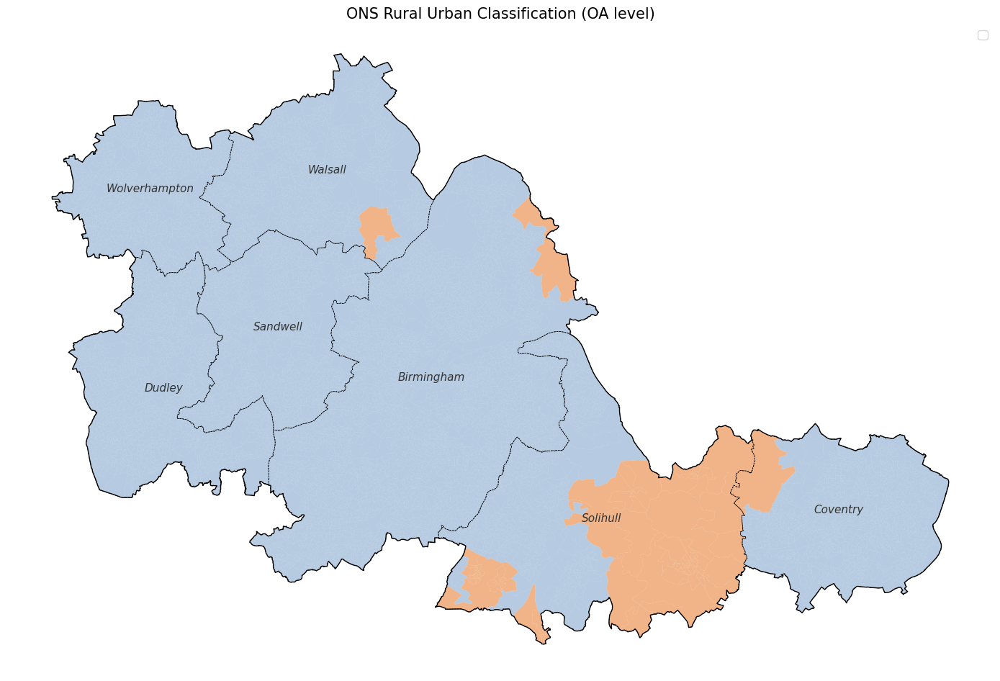

In [11]:
fig, ax = plt.subplots(figsize=(14, 11))

# Plot urban and rural OAs
oa_ruc_clipped[oa_ruc_clipped['Urban_rura'] == 'Urban'].plot(
    ax=ax, color='#4a7fb5', alpha=0.4, label='Urban'
)
oa_ruc_clipped[oa_ruc_clipped['Urban_rura'] == 'Rural'].plot(
    ax=ax, color='#e8833a', alpha=0.6, label='Rural'
)

# Borough boundaries
study_area.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5, linestyle='--')
gpd.GeoSeries([study_area_union], crs=study_area.crs).boundary.plot(
    ax=ax, edgecolor='black', linewidth=1, linestyle='-'
)

study_area.apply(lambda r: ax.annotate(
    text=r['LAD25NM'],
    xy=(r.geometry.centroid.x, r.geometry.centroid.y),
    ha='center', fontsize=11, color='#333333', fontstyle='italic'
), axis=1)

ax.legend(loc='upper right', fontsize=12)
ax.set_title('ONS Rural Urban Classification (OA level)', fontsize=15)
ax.set_axis_off()
plt.tight_layout()
plt.show()

### Junction enhancement recap (before vs after)

Before is the link-level `lts`; after is the junction-enhanced `lts_final`. The
attribution of upgrades to junction type (uncontrolled crossing, roundabout,
signalised) is produced in `junction lts`.

In [12]:
# Before (link-level lts) vs after (junction-enhanced lts_final)
comparison = pd.DataFrame({
    'Before (link-level)': network['lts'].value_counts().sort_index(),
    'After (junction)': network['lts_final'].value_counts().sort_index(),
})
comparison['Change'] = comparison['After (junction)'] - comparison['Before (link-level)']
print(comparison)

upgraded = network['lts_final'] > network['lts']
print(f"\nEdges modified: {upgraded.sum():,} / {len(network):,} ({upgraded.mean()*100:.1f}%)")

shift = (network.loc[upgraded, 'lts_final'] - network.loc[upgraded, 'lts']).value_counts().sort_index()
for s, c in shift.items():
    print(f"  +{int(s)} level: {c:,}")

len_km = network['geometry_length_m'].astype(float) / 1000
up_km = len_km[upgraded].sum()
print(f"\nLength modified: {up_km:,.1f} km ({up_km / len_km.sum() * 100:.1f}%)")


     Before (link-level)  After (junction)  Change
1.0               325051            227420  -97631
2.0                69539            152180   82641
3.0                42465             46464    3999
4.0                43173             54164   10991

Edges modified: 103,447 / 480,228 (21.5%)
  +1 level: 90,312
  +2 level: 6,105
  +3 level: 7,030

Length modified: 5,833.8 km (25.0%)


## 4. Stress-Based Network Density

Network density at LSOA level - absolute density (km of low-stress network per km²)
and relative density (proportion of the local network that is low stress). Relative
density isolates the structural prevalence of low stress from raw network density.

In [13]:
lsoa_uk = gpd.read_file(DATA_DIR/"Lower_layer_Super_Output_Areas_December_2021_Boundaries_EW_BGC_V5_-3761339731474027792.geojson")
lsoa_uk = lsoa_uk.to_crs(CRS_BNG)

# spatial join
lsoa_uk['centroid'] = lsoa_uk.geometry.centroid
lsoa_uk_centroids = lsoa_uk.set_geometry('centroid')

lsoa_wm = gpd.sjoin(lsoa_uk_centroids, study_area[["LAD25NM", "geometry"]], predicate="within")
lsoa_wm = lsoa_wm.set_geometry("geometry").drop(columns=["centroid", "index_right"])

print(f"WM LSOAs: {len(lsoa_wm)}")


WM LSOAs: 1718


### Figure — Low-stress density (LTS ≤ 2)

Panel A - absolute density (km/km²). Panel B - relative density (% of local network).
Absolute density tracks total network density; relative density reveals the
urban to rural structural contrast.

       abs_density  rel_density
count       1718.0       1718.0
mean          26.1         78.9
std            9.5         11.2
min            2.7         34.6
25%           20.0         71.4
50%           25.3         79.6
75%           31.4         87.0
max           79.7        100.0


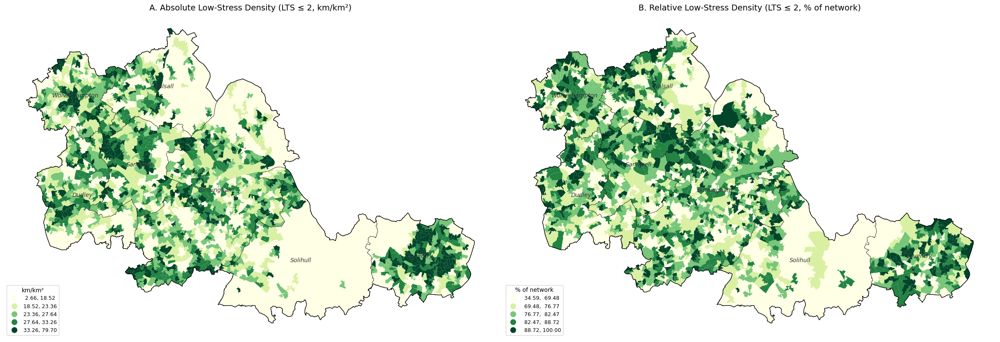

In [14]:
# =============================================================================
# 1. Compute LSOA areas
# =============================================================================
lsoa_wm['area_km2'] = lsoa_wm.geometry.area / 1e6

# =============================================================================
# 2. Spatial join: assign each edge to an LSOA
# =============================================================================
# Use representative point of each edge for assignment
net = network.copy()
net['length_km'] = net['geometry_length_m'].astype(float) / 1000
net['rep_point'] = net.geometry.representative_point()
net_pts = net.set_geometry('rep_point')

net_lsoa = gpd.sjoin(net_pts, lsoa_wm[['LSOA21CD', 'geometry']], predicate='within', how='left')
net_lsoa = net_lsoa.set_geometry('geometry').drop(columns=['rep_point', 'index_right'])

# =============================================================================
# 3. Compute densities per LSOA
# =============================================================================
# Total network length per LSOA
total_by_lsoa = net_lsoa.groupby('LSOA21CD')['length_km'].sum().rename('total_km')

# Low-stress (LTS ≤ 2) length per LSOA
low_stress = net_lsoa[net_lsoa['lts_final'] <= 2]
ls_by_lsoa = low_stress.groupby('LSOA21CD')['length_km'].sum().rename('ls_km')

# Join to LSOA
lsoa_density = lsoa_wm[['LSOA21CD', 'area_km2', 'geometry']].copy()
lsoa_density = lsoa_density.merge(total_by_lsoa, on='LSOA21CD', how='left')
lsoa_density = lsoa_density.merge(ls_by_lsoa, on='LSOA21CD', how='left')
lsoa_density[['total_km', 'ls_km']] = lsoa_density[['total_km', 'ls_km']].fillna(0)

# Absolute density: km of LTS ≤ 2 per km²
lsoa_density['abs_density'] = lsoa_density['ls_km'] / lsoa_density['area_km2']

# Relative density: % of network that is LTS ≤ 2
lsoa_density['rel_density'] = (lsoa_density['ls_km'] / lsoa_density['total_km'] * 100).fillna(0)

print(lsoa_density[['abs_density', 'rel_density']].describe().round(1))

# =============================================================================
# 4. Plot
# =============================================================================
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 11))

# --- Absolute density ---
lsoa_density.plot(
    column='abs_density', cmap='YlGn', scheme='quantiles', k=5,
    legend=True, legend_kwds={'loc': 'lower left', 'title': 'km/km²', 'fontsize': 9},
    ax=ax1, edgecolor='none', linewidth=0
)
study_area.boundary.plot(ax=ax1, edgecolor='black', linewidth=0.5, linestyle='--')
gpd.GeoSeries([study_area_union], crs=study_area.crs).boundary.plot(
    ax=ax1, edgecolor='black', linewidth=1)
study_area.apply(lambda r: ax1.annotate(
    text=r['LAD25NM'], xy=(r.geometry.centroid.x, r.geometry.centroid.y),
    ha='center', fontsize=10, color='#333', fontstyle='italic'), axis=1)
ax1.set_title('A. Absolute Low-Stress Density (LTS ≤ 2, km/km²)', fontsize=14)
ax1.set_axis_off()

# --- Relative density ---
lsoa_density.plot(
    column='rel_density', cmap='YlGn', scheme='quantiles', k=5,
    legend=True, legend_kwds={'loc': 'lower left', 'title': '% of network', 'fontsize': 9},
    ax=ax2, edgecolor='none', linewidth=0
)
study_area.boundary.plot(ax=ax2, edgecolor='black', linewidth=0.5, linestyle='--')
gpd.GeoSeries([study_area_union], crs=study_area.crs).boundary.plot(
    ax=ax2, edgecolor='black', linewidth=1)
study_area.apply(lambda r: ax2.annotate(
    text=r['LAD25NM'], xy=(r.geometry.centroid.x, r.geometry.centroid.y),
    ha='center', fontsize=10, color='#333', fontstyle='italic'), axis=1)
ax2.set_title('B. Relative Low-Stress Density (LTS ≤ 2, % of network)', fontsize=14)
ax2.set_axis_off()

plt.tight_layout()
plt.show()

In [15]:
# =============================================================================
# 1. Compute density (skip if already computed)
# =============================================================================
if 'lts1_abs' not in lsoa_density.columns:
    for lts in [1, 2, 3, 4]:
        subset = net_lsoa[net_lsoa['lts_final'] == lts]
        col = f'lts{lts}_km'
        lts_by_lsoa = subset.groupby('LSOA21CD')['length_km'].sum()
        lsoa_density[col] = lsoa_density['LSOA21CD'].map(lts_by_lsoa).fillna(0)
        lsoa_density[f'lts{lts}_abs'] = lsoa_density[col] / lsoa_density['area_km2']
        lsoa_density[f'lts{lts}_rel'] = (lsoa_density[col] / lsoa_density['total_km'] * 100).fillna(0)


### Figure — Network density by LTS level (LSOA)

Absolute and relative density for each LTS level 1 to 4. The LTS 1 and LTS 3/4
relative-density maps are near mirror images and track the urban-rural split.

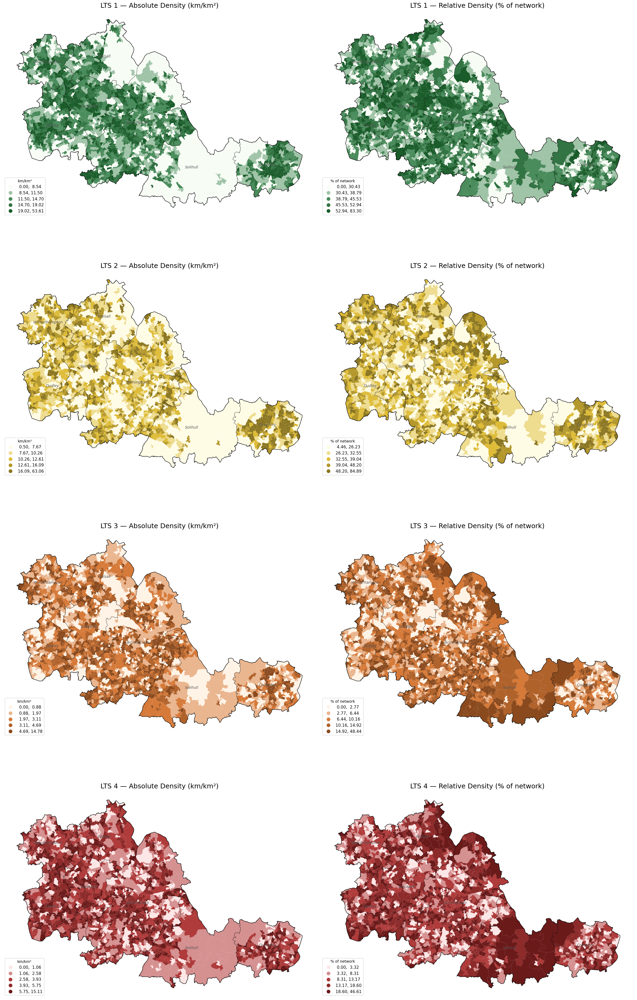

In [78]:
from matplotlib.colors import LinearSegmentedColormap
# =============================================================================
# 2. Custom colormaps per LTS
# =============================================================================
lts_cmaps = {
    1: LinearSegmentedColormap.from_list('lts1', ['#f7fcf5', '#4a8c5c', '#1a5c2a']),
    2: LinearSegmentedColormap.from_list('lts2', ['#fffce6', '#debc38', '#8a7520']),
    3: LinearSegmentedColormap.from_list('lts3', ['#fff3e6', '#d67a39', '#8a4a1e']),
    4: LinearSegmentedColormap.from_list('lts4', ['#fce6e6', '#af3b3b', '#6b1a1a']),
}

# =============================================================================
# 3. Plot: 4 rows × 2 columns
# =============================================================================
fig, axes = plt.subplots(4, 2, figsize=(24, 40))

for i, lts in enumerate([1, 2, 3, 4]):
    ax_abs = axes[i, 0]
    ax_rel = axes[i, 1]

    # --- Absolute density ---
    lsoa_density.plot(
        column=f'lts{lts}_abs', cmap=lts_cmaps[lts], scheme='quantiles', k=5,
        legend=True, legend_kwds={'loc': 'lower left', 'title': 'km/km²', 'fontsize': 11},
        ax=ax_abs, edgecolor='none', linewidth=0
    )
    study_area.boundary.plot(ax=ax_abs, edgecolor='black', linewidth=0.5, linestyle='--')
    gpd.GeoSeries([study_area_union], crs=study_area.crs).boundary.plot(
        ax=ax_abs, edgecolor='black', linewidth=1)
    study_area.apply(lambda r: ax_abs.annotate(
        text=r['LAD25NM'], xy=(r.geometry.centroid.x, r.geometry.centroid.y),
        ha='center', fontsize=10, color='#555', fontstyle='italic'), axis=1)
    ax_abs.set_title(f'LTS {lts} — Absolute Density (km/km²)', fontsize=18)
    ax_abs.set_axis_off()

    # --- Relative density ---
    lsoa_density.plot(
        column=f'lts{lts}_rel', cmap=lts_cmaps[lts], scheme='quantiles', k=5,
        legend=True, legend_kwds={'loc': 'lower left', 'title': '% of network', 'fontsize': 11},
        ax=ax_rel, edgecolor='none', linewidth=0
    )
    study_area.boundary.plot(ax=ax_rel, edgecolor='black', linewidth=0.5, linestyle='--')
    gpd.GeoSeries([study_area_union], crs=study_area.crs).boundary.plot(
        ax=ax_rel, edgecolor='black', linewidth=1)
    study_area.apply(lambda r: ax_rel.annotate(
        text=r['LAD25NM'], xy=(r.geometry.centroid.x, r.geometry.centroid.y),
        ha='center', fontsize=10, color='#555', fontstyle='italic'), axis=1)
    ax_rel.set_title(f'LTS {lts} — Relative Density (% of network)', fontsize=18)
    ax_rel.set_axis_off()

#plt.suptitle('Network Density by LTS Level (LSOA)', fontsize=18, y=1.01)
plt.tight_layout()
plt.savefig("../Figure/wm_lts_density_by_lsoa.jpg", dpi=400, bbox_inches='tight')
plt.show()

### Density statistics

Median absolute and relative densities per LTS level, and the combined LTS ≤ 2
figures.

In [17]:
print("=== Absolute Density (km/km²) ===")
for lts in [1, 2, 3, 4]:
    print(f"\nLTS {lts}:")
    print(lsoa_density[f'lts{lts}_abs'].describe().round(2))

print("\n=== LTS ≤ 2 combined ===")
lsoa_density['ls_abs'] = lsoa_density['lts1_abs'] + lsoa_density['lts2_abs']
lsoa_density['hs_abs'] = lsoa_density['lts3_abs'] + lsoa_density['lts4_abs']
print(lsoa_density['ls_abs'].describe().round(2))

print("\n=== Correlation: low-stress vs high-stress absolute density ===")
print(f"Pearson: {lsoa_density['ls_abs'].corr(lsoa_density['hs_abs']):.3f}")
print(f"Spearman: {lsoa_density['ls_abs'].corr(lsoa_density['hs_abs'], method='spearman'):.3f}")

=== Absolute Density (km/km²) ===

LTS 1:
count    1718.00
mean       13.89
std         6.72
min         0.00
25%         9.33
50%        13.16
75%        17.76
max        53.61
Name: lts1_abs, dtype: float64

LTS 2:
count    1718.00
mean       12.25
std         6.05
min         0.50
25%         8.26
50%        11.48
75%        15.03
max        63.06
Name: lts2_abs, dtype: float64

LTS 3:
count    1718.00
mean        2.96
std         2.39
min         0.00
25%         1.12
50%         2.50
75%         4.25
max        14.78
Name: lts3_abs, dtype: float64

LTS 4:
count    1718.00
mean        3.59
std         2.68
min         0.00
25%         1.46
50%         3.23
75%         5.17
max        15.11
Name: lts4_abs, dtype: float64

=== LTS ≤ 2 combined ===
count    1718.00
mean       26.14
std         9.47
min         2.66
25%        19.98
50%        25.33
75%        31.36
max        79.70
Name: ls_abs, dtype: float64

=== Correlation: low-stress vs high-stress absolute density ===
Pearson: -

In [18]:
print("\n=== Relative Density ===")
for lts in [1, 2, 3, 4]:
    print(f"\nLTS {lts} relative:")
    print(lsoa_density[f'lts{lts}_rel'].describe().round(2))

print("\n=== LTS ≤ 2 relative ===")
lsoa_density['ls_rel'] = lsoa_density['lts1_rel'] + lsoa_density['lts2_rel']
print(lsoa_density['ls_rel'].describe().round(2))


=== Relative Density ===

LTS 1 relative:
count    1718.00
mean       41.60
std        13.22
min         0.00
25%        32.79
50%        42.27
75%        50.38
max        83.30
Name: lts1_rel, dtype: float64

LTS 2 relative:
count    1718.00
mean       37.34
std        13.11
min         4.46
25%        27.73
50%        35.70
75%        45.43
max        84.89
Name: lts2_rel, dtype: float64

LTS 3 relative:
count    1718.00
mean        9.43
std         7.31
min         0.00
25%         3.82
50%         8.26
75%        13.54
max        48.44
Name: lts3_rel, dtype: float64

LTS 4 relative:
count    1718.00
mean       11.63
std         8.53
min         0.00
25%         4.71
50%        10.55
75%        17.24
max        46.61
Name: lts4_rel, dtype: float64

=== LTS ≤ 2 relative ===
count    1718.00
mean       78.94
std        11.19
min        34.59
25%        71.37
50%        79.63
75%        87.04
max       100.00
Name: ls_rel, dtype: float64


### Population exposure to low-stress networks

Joining Census 2021 usual-resident population at LSOA level to the density measures,
then reporting the share of residents in LSOAs where low-stress segments make up at
least 75% of local network length.

In [19]:
lsoa_pop = pd.read_csv(DATA_DIR / 'census2021-ts001/census2021-ts001-lsoa.csv')
lsoa_pop = lsoa_pop.rename(columns={
    'geography code': 'LSOA21CD',
    'Residence type: Total; measures: Value': 'population'
})
lsoa_density = lsoa_density.drop(columns='population', errors='ignore')
lsoa_density = lsoa_density.merge(lsoa_pop[['LSOA21CD', 'population']], on='LSOA21CD', how='left')

print(f"Total population: {lsoa_density['population'].sum():,.0f}")
print(f"LSOA count: {len(lsoa_density)}")

Total population: 2,917,976
LSOA count: 1718


In [20]:
# Low stress = LTS 1 + LTS 2
lsoa_density['low_stress_rel'] = lsoa_density['lts1_rel'] + lsoa_density['lts2_rel']

mask = lsoa_density['low_stress_rel'] > 75 

pop_in_low_stress = lsoa_density.loc[mask, 'population'].sum()
total_pop = lsoa_density['population'].sum()

print(f"LSOAs with >75% low-stress: {mask.sum()} / {len(lsoa_density)}")
print(f"Population in those LSOAs: {pop_in_low_stress:,.0f} ({pop_in_low_stress/total_pop*100:.1f}%)")

LSOAs with >75% low-stress: 1113 / 1718
Population in those LSOAs: 1,888,034 (64.7%)


## 5. Network Fragmentation

Local low-stress density does not guarantee connectivity - LTS ≤ 2 segments may be
abundant yet cut off from one another by high-stress junctions and arterial barriers.
For each cumulative LTS threshold, edges exceeding the threshold are removed and
connected components identified from the undirected projection. The largest connected
component (LCC) and its share of sub-network length measure network cohesion.

### Component analysis across cumulative LTS thresholds

Component counts, mean size, LCC length and LCC share for the full cyclable network,
a full-network baseline check, and a recomputation restricted to the LCC of the full
network (excluding topologically isolated stubs).

In [21]:
import networkx as nx

def compute_components(net, lts_col, label):
    """Compute connected component stats for cumulative LTS thresholds."""
    results = []
    for threshold in [1, 2, 3, 4]:
        sub = net[net[lts_col] <= threshold]
        
        # Build undirected graph (connectivity doesn't care about direction)
        G = nx.Graph()
        for _, row in sub.iterrows():
            G.add_edge(row['from_node'], row['to_node'], 
                       length_km=row['length_km'])
        
        components = list(nx.connected_components(G))
        n_comp = len(components)
        
        # Component sizes in km
        comp_sizes_km = []
        for comp_nodes in components:
            subG = G.subgraph(comp_nodes)
            size_km = sum(d['length_km'] for _, _, d in subG.edges(data=True))
            comp_sizes_km.append(size_km)
        
        total_km = sum(comp_sizes_km)
        lcc_km = max(comp_sizes_km) if comp_sizes_km else 0
        mean_km = total_km / n_comp if n_comp > 0 else 0
        lcc_share = lcc_km / total_km * 100 if total_km > 0 else 0
        
        results.append({
            'LTS threshold': f'≤ {threshold}',
            'Source': label,
            'Network km': round(total_km, 1),
            'Components': n_comp,
            'Mean size (km)': round(mean_km, 2),
            'LCC (km)': round(lcc_km, 1),
            'LCC share (%)': round(lcc_share, 1),
        })
    
    return pd.DataFrame(results)

# Prep
net = network.copy()
net['length_km'] = net['geometry_length_m'].astype(float) / 1000

# Run for link-level and junction-enhanced
link_stats = compute_components(net, 'lts', 'Link-level')
junc_stats = compute_components(net, 'lts_final', 'Junction-enhanced')

# Combine
comp_table = pd.concat([link_stats, junc_stats], ignore_index=True)
print(comp_table.to_string(index=False))

LTS threshold            Source  Network km  Components  Mean size (km)  LCC (km)  LCC share (%)
          ≤ 1        Link-level      7938.9       40672            0.20     311.8            3.9
          ≤ 2        Link-level      9740.4       30941            0.31     634.4            6.5
          ≤ 3        Link-level     10798.3       26785            0.40    3276.7           30.3
          ≤ 4        Link-level     12254.7       21944            0.56   10634.6           86.8
          ≤ 1 Junction-enhanced      6558.6       48212            0.14     181.9            2.8
          ≤ 2 Junction-enhanced      9608.5       31592            0.30     517.5            5.4
          ≤ 3 Junction-enhanced     10697.4       27204            0.39    2972.6           27.8
          ≤ 4 Junction-enhanced     12254.7       21944            0.56   10634.6           86.8


In [22]:
# Check: how many components in the FULL network (all edges, no LTS filter)?
G_full = nx.Graph()
for _, row in net.iterrows():
    G_full.add_edge(row['from_node'], row['to_node'], length_km=row['length_km'])

full_comps = [
    sum(d['length_km'] for _, _, d in G_full.subgraph(c).edges(data=True))
    for c in nx.connected_components(G_full)
]
s = pd.Series(sorted(full_comps, reverse=True))
print(f"Full network components: {len(s)}")
print(f"<100m: {(s < 0.1).sum()}")
print(f"<500m: {(s < 0.5).sum()}")
print(f"LCC: {s.iloc[0]:.1f} km ({s.iloc[0]/s.sum()*100:.1f}%)")

Full network components: 21944
<100m: 18977
<500m: 21542
LCC: 10634.6 km (86.8%)


In [23]:
# 1. Build full network graph
G_full = nx.Graph()
for _, row in net.iterrows():
    G_full.add_edge(row['from_node'], row['to_node'], length_km=row['length_km'])

# 2. Extract LCC nodes
lcc_nodes = max(nx.connected_components(G_full), key=len)
print(f"LCC nodes: {len(lcc_nodes)} / {G_full.number_of_nodes()}")

# 3. Filter network to LCC only
net_lcc = net[net['from_node'].isin(lcc_nodes) & net['to_node'].isin(lcc_nodes)].copy()
print(f"LCC edges: {len(net_lcc)} / {len(net)}")
print(f"LCC km: {net_lcc['length_km'].sum():.1f} / {net['length_km'].sum():.1f}")

# 4. Re-run component analysis on LCC subset
link_stats = compute_components(net_lcc, 'lts', 'Link-level (LCC)')
junc_stats = compute_components(net_lcc, 'lts_final', 'Junction-enhanced (LCC)')
comp_table = pd.concat([link_stats, junc_stats], ignore_index=True)
print(comp_table.to_string(index=False))

LCC nodes: 193995 / 253548
LCC edges: 403071 / 480228
LCC km: 20050.1 / 23300.9
LTS threshold                  Source  Network km  Components  Mean size (km)  LCC (km)  LCC share (%)
          ≤ 1        Link-level (LCC)      6329.0       18732            0.34     311.8            4.9
          ≤ 2        Link-level (LCC)      8128.2        8993            0.90     634.4            7.8
          ≤ 3        Link-level (LCC)      9184.4        4841            1.90    3276.7           35.7
          ≤ 4        Link-level (LCC)     10634.6           1        10634.63   10634.6          100.0
          ≤ 1 Junction-enhanced (LCC)      4955.6       26176            0.19     181.9            3.7
          ≤ 2 Junction-enhanced (LCC)      7996.9        9637            0.83     517.5            6.5
          ≤ 3 Junction-enhanced (LCC)      9083.4        5260            1.73    2972.6           32.7
          ≤ 4 Junction-enhanced (LCC)     10634.6           1        10634.63   10634.6         

### Figure — Fragmentation overview

Panel A - component rank-size (Zipf) distribution. Panel B - network length against
fragmentation (component count), link-level vs junction-enhanced. Panel C
length-weighted component size distribution (KDE).

Junction-enhanced LTS ≤ 1: peak at 0.33 km, density = 0.625
Junction-enhanced LTS ≤ 2: peak at 9.06 km, density = 0.420
Link-level LTS ≤ 1: peak at 0.57 km, density = 0.521
Link-level LTS ≤ 2: peak at 10.40 km, density = 0.411


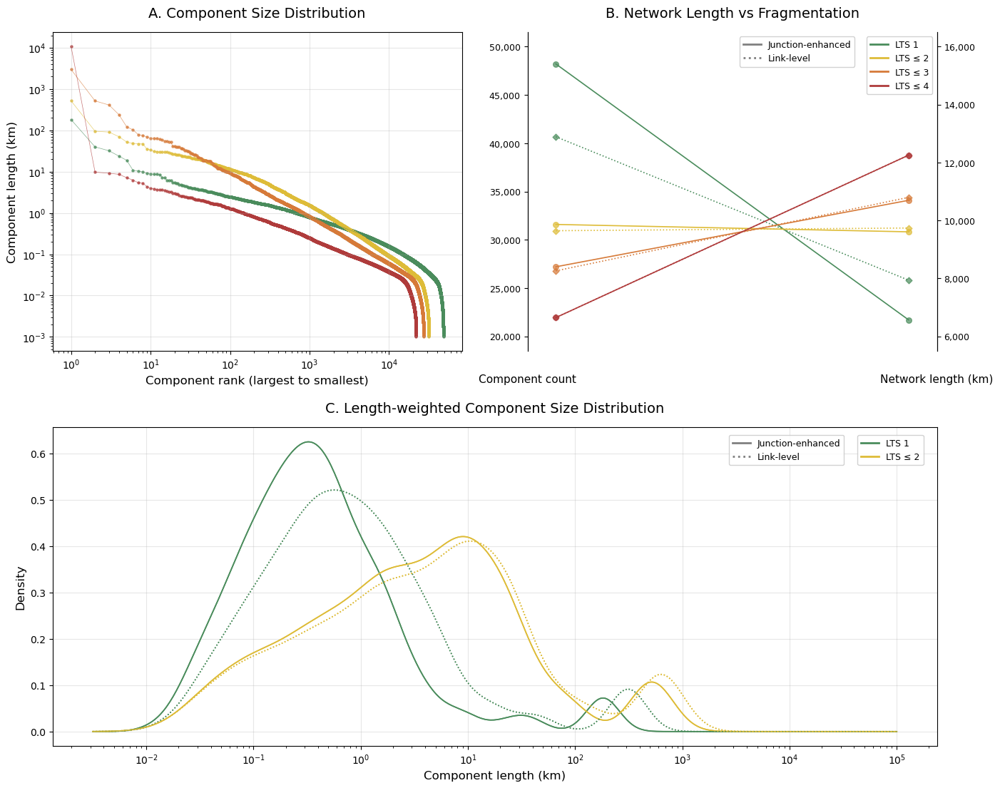

In [38]:
from scipy.stats import gaussian_kde
# Combined Figure: A (Zipf), B (Slope), C (Length-weighted KDE)
# Assumes variables already exist:
# net, nx, np, plt, gaussian_kde, Line2D

fig = plt.figure(figsize=(16, 13))

gs = gridspec.GridSpec(
    2, 2,
    height_ratios=[1, 1],
    hspace=0.24,
    wspace=0.16          
)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, :])

lts_colors = {1:'#4a8c5c',2:'#debc38',3:'#d67a39',4:'#af3b3b'}
lts_labels = {1:'LTS 1',2:'LTS ≤ 2',3:'LTS ≤ 3',4:'LTS ≤ 4'}

# ---------------- Panel A ----------------
for threshold in [1,2,3,4]:
    sub = net[net['lts_final']<=threshold]
    G = nx.Graph()
    for _,r in sub.iterrows():
        G.add_edge(r['from_node'],r['to_node'],length_km=r['length_km'])
    comp_sizes = sorted([
        sum(d['length_km'] for *_,d in G.subgraph(c).edges(data=True))
        for c in nx.connected_components(G)
    ], reverse=True)
    ranks=np.arange(1,len(comp_sizes)+1)
    ax1.plot(ranks,comp_sizes,color=lts_colors[threshold],lw=0.5,alpha=0.7)
    ax1.scatter(ranks,comp_sizes,s=5,color=lts_colors[threshold],alpha=0.7)

ax1.set_xscale('log'); ax1.set_yscale('log')
ax1.set_xlabel('Component rank (largest to smallest)',fontsize=12)
ax1.set_ylabel('Component length (km)',fontsize=12)
ax1.set_title('A. Component Size Distribution',fontsize=14,pad=15)
ax1.grid(True,alpha=.3)

# ---------------- Panel B ----------------
data={
    ('Junction-enhanced',1):(6568.7,48212),('Junction-enhanced',2):(9608.5,31592),
    ('Junction-enhanced',3):(10696.4,27204),('Junction-enhanced',4):(12254.7,21944),
    ('Link-level',1):(7938.9,40672),('Link-level',2):(9740.4,30941),
    ('Link-level',3):(10798.3,26785),('Link-level',4):(12254.7,21944)
}

cmin, cmax = 20000, 50000
lmin, lmax = 6000, 16000
yc = lambda c: (c - cmin) / (cmax - cmin)
yl = lambda l: (l - lmin) / (lmax - lmin)
x_left, x_right = 0, 1

offset = 0.06  

for t in [1,2,3,4]:
    jl, jc = data[('Junction-enhanced', t)]
    ll, lc = data[('Link-level', t)]
    ax2.plot([x_left - offset, x_right + offset], [yc(jc), yl(jl)], '-', color=lts_colors[t], lw=1.2)
    ax2.plot([x_left - offset, x_right + offset], [yc(lc), yl(ll)], ':', color=lts_colors[t], lw=1.2)
    ax2.scatter([x_left - offset], [yc(jc)], color=lts_colors[t], s=30, alpha=0.7)
    ax2.scatter([x_right + offset], [yl(jl)], color=lts_colors[t], s=30, alpha=0.7)
    ax2.scatter([x_left - offset], [yc(lc)], color=lts_colors[t], s=20, marker='D', alpha=0.7)
    ax2.scatter([x_right + offset], [yl(ll)], color=lts_colors[t], s=20, marker='D', alpha=0.7)

ax2.set_xlim(-0.15, 1.15)
ax2.set_ylim(-0.05, 1.05)
ax2.spines[['top', 'bottom']].set_visible(False)
ax2.tick_params(axis='x', which='both', length=0, labelbottom=False)
ax2.set_xticks([])
ax2.text(0, -0.1, 'Component count', transform=ax2.transAxes, fontsize=11, ha='center')
ax2.text(1, -0.1, 'Network length (km)', transform=ax2.transAxes, fontsize=11, ha='center')
ax2.set_title('B. Network Length vs Fragmentation', fontsize=14, pad=15)

# Left y-axis: component count
left_values = [20000, 25000, 30000, 35000, 40000, 45000, 50000]
left_ticks = [(v - cmin) / (cmax - cmin) for v in left_values]
left_labels = [f'{v:,}' for v in left_values]
ax2.set_yticks(left_ticks)
ax2.set_yticklabels(left_labels, fontsize=9)

# Right y-axis: network length
ax2_right = ax2.twinx()
ax2_right.set_ylim(-0.05, 1.05)
ax2_right.spines[['top', 'bottom']].set_visible(False)
right_values = [6000, 8000, 10000, 12000, 14000, 16000]
right_ticks = [(v - lmin) / (lmax - lmin) for v in right_values]
right_labels = [f'{v:,}' for v in right_values]
ax2_right.set_yticks(right_ticks)
ax2_right.set_yticklabels(right_labels, fontsize=9)

# ---------------- Panel C ----------------
x_log=np.linspace(-2.5,5,500)
for col,style in [('lts_final','-'),('lts',':')]:
    for t in [1,2]:
        sub=net[net[col]<=t]
        G=nx.Graph()
        for _,r in sub.iterrows():
            G.add_edge(r['from_node'],r['to_node'],length_km=r['length_km'])
        sizes=[]
        for comp in nx.connected_components(G):
            s=sum(d['length_km'] for *_,d in G.subgraph(comp).edges(data=True))
            if s>0.01: sizes.append(s)
        if len(sizes)<2: continue
        sizes=np.array(sizes)
        kde=gaussian_kde(np.log10(sizes),weights=sizes/sizes.sum(),bw_method=.2)
        ax3.plot(10**x_log,kde(x_log),color=lts_colors[t],lw=1.2,linestyle=style)

ax3.set_xscale('log')
ax3.set_xlabel('Component length (km)',fontsize=12)
ax3.set_ylabel('Density',fontsize=12)
ax3.set_title('C. Length-weighted Component Size Distribution',fontsize=14,pad=15)
ax3.grid(True, alpha=.3) 

# ---------------- Panel C ----------------
x_log = np.linspace(-2.5, 5, 500)
for col, style, label in [('lts_final', '-', 'Junction-enhanced'), ('lts', ':', 'Link-level')]:
    for t in [1, 2]:
        sub = net[net[col] <= t]
        G = nx.Graph()
        for _, r in sub.iterrows():
            G.add_edge(r['from_node'], r['to_node'], length_km=r['length_km'])
        sizes = []
        for comp in nx.connected_components(G):
            s = sum(d['length_km'] for *_, d in G.subgraph(comp).edges(data=True))
            if s > 0.01: sizes.append(s)
        if len(sizes) < 2: continue
        sizes = np.array(sizes)
        kde = gaussian_kde(np.log10(sizes), weights=sizes / sizes.sum(), bw_method=.2)
        density = kde(x_log)
        peak_idx = np.argmax(density)
        peak_km = 10 ** x_log[peak_idx]
        peak_density = density[peak_idx]
        print(f'{label} LTS ≤ {t}: peak at {peak_km:.2f} km, density = {peak_density:.3f}')
        ax3.plot(10 ** x_log, density, color=lts_colors[t], lw=1.2, linestyle=style)

# ---------------- Legends ----------------
lts_legend=[Line2D([0],[0],color=lts_colors[t],lw=2,label=lts_labels[t]) for t in [1,2,3,4]]
lts_legend_c=[Line2D([0],[0],color=lts_colors[t],lw=2,label=lts_labels[t]) for t in [1,2]]
style_legend=[
    Line2D([0],[0],color='grey',lw=2,linestyle='-',label='Junction-enhanced'),
    Line2D([0],[0],color='grey',lw=2,linestyle=':',label='Link-level')
]

legB1 = ax2.legend(handles=lts_legend, loc='upper right',
                   bbox_to_anchor=(1.00, 1.00), fontsize=9, framealpha=0.9)
ax2.add_artist(legB1)
ax2.legend(handles=style_legend, loc='upper right',
           bbox_to_anchor=(0.81, 1.00), fontsize=9, framealpha=0.9)

legC1 = ax3.legend(handles=lts_legend_c, loc='upper right',
                   bbox_to_anchor=(0.99, 0.99), fontsize=9, framealpha=0.9)
ax3.add_artist(legC1)
ax3.legend(handles=style_legend, loc='upper right',
           bbox_to_anchor=(0.9, 0.99), fontsize=9, framealpha=0.9)

plt.tight_layout()
#plt.savefig("../Figure/wm_lts_fragmentation.png", dpi=300, bbox_inches='tight')
plt.show()

### Spatial distribution of connectivity

For each LSOA, the size of the largest low-stress component it belongs to at LTS 1
and LTS ≤ 2. **Figure 5.7** (below) maps LCC size per LSOA.

In [32]:
# For each LSOA, compute the size of the largest component it belongs to
# at LTS ≤ 1 and LTS ≤ 2

for threshold, lts_col in [(1, 'lts_final'), (2, 'lts_final')]:
    sub = net[net[lts_col] <= threshold]
    G = nx.Graph()
    for _, row in sub.iterrows():
        G.add_edge(row['from_node'], row['to_node'], length_km=row['length_km'])
    
    # Map each node to its component size
    node_comp_size = {}
    for comp_nodes in nx.connected_components(G):
        subG = G.subgraph(comp_nodes)
        size_km = sum(d['length_km'] for _, _, d in subG.edges(data=True))
        for n in comp_nodes:
            node_comp_size[n] = size_km
    
    # Assign to edges, then aggregate to LSOA (max component size per LSOA)
    sub_with_size = sub.copy()
    sub_with_size['comp_size_km'] = sub_with_size['from_node'].map(node_comp_size)
    
    # Spatial join to LSOA
    sub_pts = sub_with_size.copy()
    sub_pts['rep_point'] = sub_pts.geometry.representative_point()
    sub_pts = sub_pts.set_geometry('rep_point')
    
    joined = gpd.sjoin(sub_pts, lsoa_wm[['LSOA21CD', 'geometry']], predicate='within', how='left')
    
    lcc_by_lsoa = joined.groupby('LSOA21CD')['comp_size_km'].max().rename(f'lcc_size_lts{threshold}')
    lsoa_density = lsoa_density.merge(lcc_by_lsoa, on='LSOA21CD', how='left')
    lsoa_density[f'lcc_size_lts{threshold}'] = lsoa_density[f'lcc_size_lts{threshold}'].fillna(0)

print(lsoa_density[['lcc_size_lts1', 'lcc_size_lts2']].describe().round(1))

       lcc_size_lts1  lcc_size_lts2
count         1718.0         1718.0
mean            17.4           83.7
std             48.5          168.7
min              0.0            0.7
25%              0.7            7.2
50%              1.3           14.7
75%              3.0           30.6
max            181.9          517.5


#### Spatial autocorrelation (Moran's I)

Whether local connectivity is spatially clustered, across LTS thresholds and for
single-level bands, link-level vs junction-enhanced.

In [33]:
from esda.moran import Moran
from libpysal.weights import Queen

w = Queen.from_dataframe(lsoa_density)
mi = Moran(lsoa_density['lcc_size_lts2'], w)
print(f"Moran's I: {mi.I:.3f}, p-value: {mi.p_sim:.4f}")

Moran's I: 0.566, p-value: 0.0010


In [34]:
from esda.moran import Moran
from libpysal.weights import Queen

w = Queen.from_dataframe(lsoa_density)

for threshold in [1, 2, 3, 4]:
    for lts_col, label in [('lts', 'Link-level'), ('lts_final', 'Junction-enhanced')]:
        sub = net[net[lts_col] <= threshold]
        G = nx.Graph()
        for _, row in sub.iterrows():
            G.add_edge(row['from_node'], row['to_node'], length_km=row['length_km'])
        
        node_comp_size = {}
        for comp_nodes in nx.connected_components(G):
            subG = G.subgraph(comp_nodes)
            size_km = sum(d['length_km'] for _, _, d in subG.edges(data=True))
            for n in comp_nodes:
                node_comp_size[n] = size_km
        
        sub_with_size = sub.copy()
        sub_with_size['comp_size_km'] = sub_with_size['from_node'].map(node_comp_size)
        sub_with_size['rep_point'] = sub_with_size.geometry.representative_point()
        sub_pts = sub_with_size.set_geometry('rep_point')
        
        joined = gpd.sjoin(sub_pts, lsoa_wm[['LSOA21CD', 'geometry']], predicate='within', how='left')
        lcc_by_lsoa = joined.groupby('LSOA21CD')['comp_size_km'].max()
        
        col_name = f'lcc_lts{threshold}_{label.lower().replace("-", "_")}'
        lsoa_density[col_name] = lsoa_density['LSOA21CD'].map(lcc_by_lsoa).fillna(0)
        
        mi = Moran(lsoa_density[col_name], w)
        print(f"LTS ≤ {threshold} ({label}): Moran's I = {mi.I:.3f}, p = {mi.p_sim:.4f}")

LTS ≤ 1 (Link-level): Moran's I = 0.500, p = 0.0010
LTS ≤ 1 (Junction-enhanced): Moran's I = 0.479, p = 0.0010
LTS ≤ 2 (Link-level): Moran's I = 0.597, p = 0.0010
LTS ≤ 2 (Junction-enhanced): Moran's I = 0.566, p = 0.0010
LTS ≤ 3 (Link-level): Moran's I = 0.813, p = 0.0010
LTS ≤ 3 (Junction-enhanced): Moran's I = 0.799, p = 0.0010
LTS ≤ 4 (Link-level): Moran's I = 1.000, p = 0.0010
LTS ≤ 4 (Junction-enhanced): Moran's I = 1.000, p = 0.0010


In [35]:
for lts_level in [1, 2, 3, 4]:
    for lts_col, label in [('lts', 'Link-level'), ('lts_final', 'Junction-enhanced')]:
        sub = net[net[lts_col] == lts_level]
        G = nx.Graph()
        for _, row in sub.iterrows():
            G.add_edge(row['from_node'], row['to_node'], length_km=row['length_km'])
        
        node_comp_size = {}
        for comp_nodes in nx.connected_components(G):
            subG = G.subgraph(comp_nodes)
            size_km = sum(d['length_km'] for _, _, d in subG.edges(data=True))
            for n in comp_nodes:
                node_comp_size[n] = size_km
        
        sub_with_size = sub.copy()
        sub_with_size['comp_size_km'] = sub_with_size['from_node'].map(node_comp_size)
        sub_with_size['rep_point'] = sub_with_size.geometry.representative_point()
        sub_pts = sub_with_size.set_geometry('rep_point')
        
        joined = gpd.sjoin(sub_pts, lsoa_wm[['LSOA21CD', 'geometry']], predicate='within', how='left')
        lcc_by_lsoa = joined.groupby('LSOA21CD')['comp_size_km'].max()
        
        col_name = f'lcc_lts{lts_level}_only_{label.lower().replace("-", "_")}'
        lsoa_density[col_name] = lsoa_density['LSOA21CD'].map(lcc_by_lsoa).fillna(0)
        
        mi = Moran(lsoa_density[col_name], w)
        print(f"LTS {lts_level} only ({label}): Moran's I = {mi.I:.3f}, p = {mi.p_sim:.4f}")

LTS 1 only (Link-level): Moran's I = 0.500, p = 0.0010
LTS 1 only (Junction-enhanced): Moran's I = 0.479, p = 0.0010
LTS 2 only (Link-level): Moran's I = 0.638, p = 0.0010
LTS 2 only (Junction-enhanced): Moran's I = 0.567, p = 0.0010
LTS 3 only (Link-level): Moran's I = 0.617, p = 0.0010
LTS 3 only (Junction-enhanced): Moran's I = 0.616, p = 0.0010
LTS 4 only (Link-level): Moran's I = 0.553, p = 0.0010
LTS 4 only (Junction-enhanced): Moran's I = 0.514, p = 0.0010


#### Connectivity vs population and urban/rural

Population density per LSOA, the correlation between LCC size and population density,
LCC size by urban/rural, local component counts, and **Figure 5.7** (LCC-size
choropleths). The final cell reports junction upgrades by urban/rural.

In [36]:
# Aggregate OA population to LSOA
lsoa_pop = oa_ruc_clipped.groupby('LSOA21CD')['population'].sum()
lsoa_density['population'] = lsoa_density['LSOA21CD'].map(lsoa_pop).fillna(0)
lsoa_density['pop_density'] = lsoa_density['population'] / lsoa_density['area_km2']

print(lsoa_density['pop_density'].describe().round(1))

count     1718.0
mean      5531.5
std       3221.9
min         88.5
25%       3523.8
50%       5057.9
75%       6722.5
max      31267.2
Name: pop_density, dtype: float64


lcc_lts1_junction_enhanced: Pearson=-0.103, Spearman=-0.161
lcc_lts2_junction_enhanced: Pearson=-0.042, Spearman=-0.036

=== LCC size by urban/rural ===

lcc_lts1_junction_enhanced:
             mean  50%    max
is_urban_oa                  
Rural         3.0  2.5    6.2
Urban        17.6  1.3  181.9

lcc_lts2_junction_enhanced:
             mean   50%    max
is_urban_oa                   
Rural        10.2   9.1   14.2
Urban        84.4  15.0  517.5

LTS ≤ 1 — local component count per LSOA:
  mean=30.55, median=27, max=206

LTS ≤ 2 — local component count per LSOA:
  mean=21.01, median=18, max=140

LTS ≤ 3 — local component count per LSOA:
  mean=18.08, median=15, max=104

LTS ≤ 4 — local component count per LSOA:
  mean=14.10, median=12, max=81


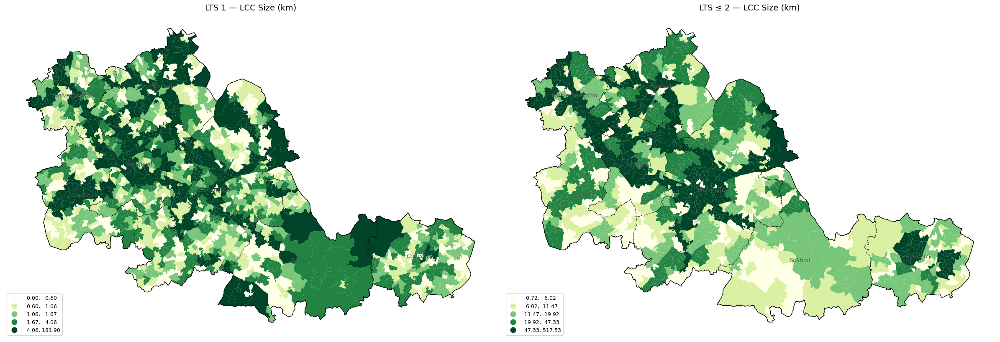

In [37]:
# 1. LCC size vs population density — is it actually correlated?
lsoa_density['pop_density'] = lsoa_density['population'] / lsoa_density['area_km2']
for col in ['lcc_lts1_junction_enhanced', 'lcc_lts2_junction_enhanced']:
    pearson = lsoa_density[col].corr(lsoa_density['pop_density'])
    spearman = lsoa_density[col].corr(lsoa_density['pop_density'], method='spearman')
    print(f"{col}: Pearson={pearson:.3f}, Spearman={spearman:.3f}")

# 2. LCC size vs urban/rural
print("\n=== LCC size by urban/rural ===")
lsoa_density['is_urban_oa'] = lsoa_density['LSOA21CD'].map(
    oa_ruc_clipped.groupby('LSOA21CD')['Urban_rura'].first()
)
for col in ['lcc_lts1_junction_enhanced', 'lcc_lts2_junction_enhanced']:
    print(f"\n{col}:")
    print(lsoa_density.groupby('is_urban_oa')[col].describe()[['mean', '50%', 'max']].round(1))

# 3. Local component count per LSOA (like Denmark's hex grid analysis)
for threshold in [1, 2, 3, 4]:
    sub = net[net['lts_final'] <= threshold]
    G = nx.Graph()
    for _, row in sub.iterrows():
        G.add_edge(row['from_node'], row['to_node'], length_km=row['length_km'])
    
    # Map each node to component id
    node_to_comp = {}
    for i, comp_nodes in enumerate(nx.connected_components(G)):
        for n in comp_nodes:
            node_to_comp[n] = i
    
    sub_with_comp = sub.copy()
    sub_with_comp['comp_id'] = sub_with_comp['from_node'].map(node_to_comp)
    sub_with_comp['rep_point'] = sub_with_comp.geometry.representative_point()
    sub_pts = sub_with_comp.set_geometry('rep_point')
    
    joined = gpd.sjoin(sub_pts, lsoa_wm[['LSOA21CD', 'geometry']], predicate='within', how='left')
    local_comp_count = joined.groupby('LSOA21CD')['comp_id'].nunique()
    
    print(f"\nLTS ≤ {threshold} — local component count per LSOA:")
    print(f"  mean={local_comp_count.mean():.2f}, median={local_comp_count.median():.0f}, "
          f"max={local_comp_count.max()}")

# 4. Plot LCC size choropleth to actually see the pattern
fig, axes = plt.subplots(1, 2, figsize=(24, 11))
for i, (col, title) in enumerate([
    ('lcc_lts1_junction_enhanced', 'LTS 1 — LCC Size (km)'),
    ('lcc_lts2_junction_enhanced', 'LTS ≤ 2 — LCC Size (km)')
]):
    lsoa_density.plot(
        column=col, cmap='YlGn', scheme='quantiles', k=5,
        legend=True, legend_kwds={'loc': 'lower left', 'fontsize': 9},
        ax=axes[i], edgecolor='none'
    )
    study_area.boundary.plot(ax=axes[i], edgecolor='black', linewidth=0.5, linestyle='--')
    gpd.GeoSeries([study_area_union], crs=study_area.crs).boundary.plot(
        ax=axes[i], edgecolor='black', linewidth=1)
    study_area.apply(lambda r: axes[i].annotate(
        text=r['LAD25NM'], xy=(r.geometry.centroid.x, r.geometry.centroid.y),
        ha='center', fontsize=10, color='#555', fontstyle='italic'), axis=1)
    axes[i].set_title(title, fontsize=14)
    axes[i].set_axis_off()
plt.tight_layout()
plt.show()

In [38]:
# Junction density: urban vs rural
net_with_urban = net.copy()
net_with_urban['rep_point'] = net_with_urban.geometry.representative_point()
net_pts = net_with_urban.set_geometry('rep_point')
net_urban = gpd.sjoin(net_pts, lsoa_wm[['LSOA21CD', 'geometry']], predicate='within', how='left')
net_urban = net_urban.set_geometry('geometry').drop(columns=['rep_point', 'index_right'])
net_urban['is_urban'] = net_urban['LSOA21CD'].map(
    lsoa_density.set_index('LSOA21CD')['is_urban_oa']
)

# Edges upgraded by junction in urban vs rural
upgraded = net_urban[net_urban['lts_final'] > net_urban['lts']]
print("Junction upgrades by urban/rural:")
print(upgraded.groupby('is_urban').size())
print("\nAs % of edges:")
total_by_urban = net_urban.groupby('is_urban').size()
print((upgraded.groupby('is_urban').size() / total_by_urban * 100).round(1))

Junction upgrades by urban/rural:
is_urban
Rural      2278
Urban    100993
dtype: int64

As % of edges:
is_urban
Rural    26.0
Urban    21.5
dtype: float64
